In [9]:
#Basic and most important libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from collections import Counter
from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
import plotly

#Classifiers
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, VotingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression, RidgeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.naive_bayes import GaussianNB
from xgboost import plot_importance
from xgboost import XGBRegressor
from sklearn.svm import SVR

#Model Evaluation tools
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score

#Data processing functions
from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

import warnings
warnings.filterwarnings("ignore")
from PIL import Image

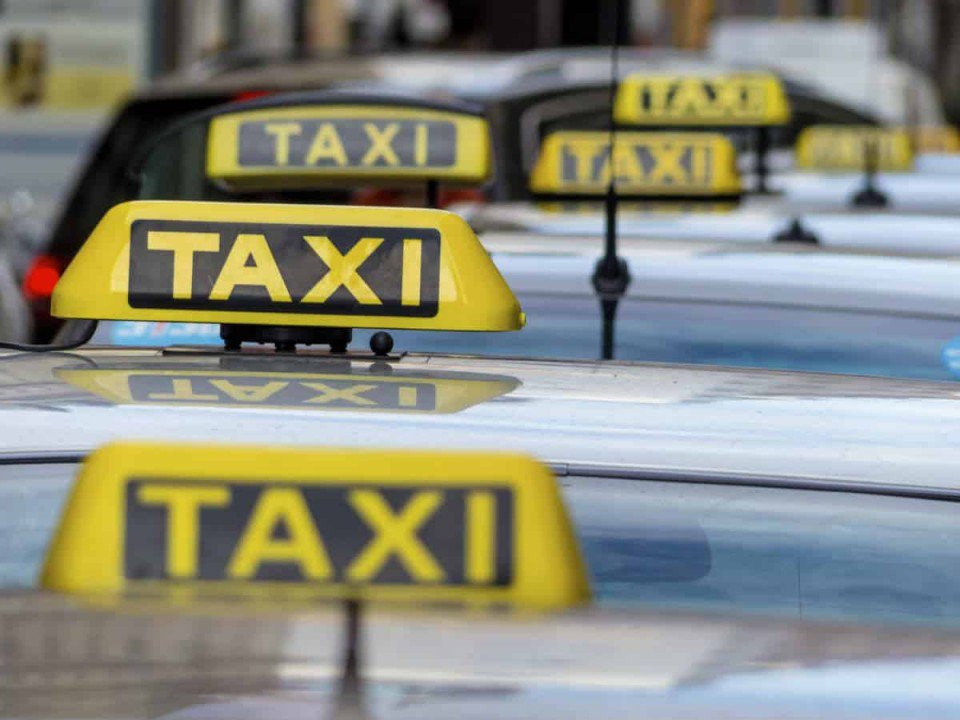

In [10]:
Image.open("taxi.jpeg")

The Taxi Fare Prediction project is designed to streamline the taxi service experience by employing predictive analytics to estimate fare amounts accurately. Utilizing historical data, machine learning models, and factors such as distance, time of day, and traffic patterns, the project aims to provide passengers with reliable fare predictions before the journey commences. This predictive approach not only enhances transparency for passengers but also assists drivers in managing their schedules and optimizing routes. By leveraging real-time data and advanced algorithms, the project strives to improve the precision of fare predictions, ensuring that both passengers and drivers benefit from a fair and predictable pricing system. Ultimately, the Taxi Fare Prediction project seeks to create a more seamless and trustworthy ride-hailing experience for all stakeholders involved.

In [11]:
#default theme
sns.set_theme(palette='tab10',
             font='Lucida Calligraphy',
             font_scale=1.0,
             style='darkgrid')
import matplotlib
matplotlib.rcParams.update({'font.size':10})
plt.style.use('dark_background')

In [12]:
df=pd.read_csv("TaxiFare.csv")

In [13]:
df.sample(10).style.background_gradient(cmap='coolwarm')

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
18929,12:00.0,17.500000,2013-12-20 13:12:00 UTC,-73.978007,40.762895,-73.990330,40.740812,3
20142,11:00.0,8.500000,2010-12-28 08:11:00 UTC,0.000000,0.000000,0.000000,0.000000,1
31887,06:07.0,10.500000,2010-05-14 18:06:07 UTC,-73.971200,40.786094,-73.938721,40.805058,1
21459,24:07.0,11.700000,2009-02-19 09:24:07 UTC,-73.923227,40.744136,-73.969578,40.763524,1
7334,30:06.0,9.000000,2009-01-29 23:30:06 UTC,-73.984048,40.749149,-73.998148,40.726195,1
20745,12:00.0,5.700000,2012-06-19 18:12:00 UTC,-73.974387,40.755432,-73.984887,40.757412,1
45350,09:06.0,7.000000,2015-02-28 01:09:06 UTC,-73.997871,40.744984,-73.980858,40.745327,2
8566,16:00.0,8.500000,2010-03-14 21:16:00 UTC,-73.964615,40.808350,-73.943483,40.820678,1
13733,25:00.0,13.700000,2009-07-13 07:25:00 UTC,-73.993563,40.749847,-73.959852,40.779517,1
8776,21:55.0,7.000000,2014-06-28 01:21:55 UTC,-74.002808,40.733683,-74.007908,40.739410,3


In [14]:
df.shape

(50000, 8)

In [15]:
df.describe().style.background_gradient(cmap='rainbow')

,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,11.364171,-72.509756,39.933759,-72.504616,39.926251,1.667840
std,9.685557,10.393860,6.224857,10.407570,6.014737,1.289195
min,-5.000000,-75.423848,-74.006893,-84.654241,-74.006377,0.000000
25%,6.000000,-73.992062,40.734880,-73.991152,40.734372,1.000000
50%,8.500000,-73.981840,40.752678,-73.980082,40.753372,1.000000
75%,12.500000,-73.967148,40.767360,-73.963584,40.768167,2.000000
max,200.000000,40.783472,401.083332,40.851027,43.415190,6.000000


In [16]:
df.dtypes

unique_id                object
amount                  float64
date_time_of_pickup      object
longitude_of_pickup     float64
latitude_of_pickup      float64
longitude_of_dropoff    float64
latitude_of_dropoff     float64
no_of_passenger           int64
dtype: object

In [17]:
pd.to_datetime(df['date_time_of_pickup'])

0       2009-06-15 17:26:21+00:00
1       2010-01-05 16:52:16+00:00
2       2011-08-18 00:35:00+00:00
3       2012-04-21 04:30:42+00:00
4       2010-03-09 07:51:00+00:00
                   ...           
49995   2013-06-12 23:25:15+00:00
49996   2015-06-22 17:19:18+00:00
49997   2011-01-30 04:53:00+00:00
49998   2012-11-06 07:09:00+00:00
49999   2010-01-13 08:13:14+00:00
Name: date_time_of_pickup, Length: 50000, dtype: datetime64[ns, UTC]

In [18]:
import datetime

In [19]:
df['date_time_of_pickup']=pd.to_datetime(df['date_time_of_pickup'])-datetime.timedelta(hours=4)

In [20]:
df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
0,26:21.0,4.5,2009-06-15 13:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1
1,52:16.0,16.9,2010-01-05 12:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1
2,35:00.0,5.7,2011-08-17 20:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2
3,30:42.0,7.7,2012-04-21 00:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1
4,51:00.0,5.3,2010-03-09 03:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1


In [21]:
df['date_time_of_pickup'].dt.month

0         6
1         1
2         8
3         4
4         3
         ..
49995     6
49996     6
49997     1
49998    11
49999     1
Name: date_time_of_pickup, Length: 50000, dtype: int32

In [22]:
df['Year']=df['date_time_of_pickup'].dt.year
df['Month']=df['date_time_of_pickup'].dt.month
df['Day']=df['date_time_of_pickup'].dt.day
df['Hours']=df['date_time_of_pickup'].dt.hour
df['Minutes']=df['date_time_of_pickup'].dt.minute

In [23]:
df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,Year,Month,Day,Hours,Minutes
0,26:21.0,4.5,2009-06-15 13:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26
1,52:16.0,16.9,2010-01-05 12:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52
2,35:00.0,5.7,2011-08-17 20:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35
3,30:42.0,7.7,2012-04-21 00:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30
4,51:00.0,5.3,2010-03-09 03:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51


In [24]:
df['morning_night']=np.where(df['Hours']<12,0,1)

In [25]:
df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,Year,Month,Day,Hours,Minutes,morning_night
0,26:21.0,4.5,2009-06-15 13:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26,1
1,52:16.0,16.9,2010-01-05 12:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52,1
2,35:00.0,5.7,2011-08-17 20:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35,1
3,30:42.0,7.7,2012-04-21 00:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30,0
4,51:00.0,5.3,2010-03-09 03:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51,0


In [26]:
df.drop('date_time_of_pickup',axis=1,inplace=True)

In [27]:
from sklearn.metrics.pairwise import haversine_distances
from math import radians
newdelhi = [28.6139, 77.2090]
bangalore = [12.9716, 77.5946]

In [28]:
newdelhi_in_radians = [radians(_) for _ in newdelhi]
bangalore_in_radians = [radians(_) for _ in bangalore]

In [29]:
result = haversine_distances([newdelhi_in_radians, bangalore_in_radians])

In [30]:
result*6371

array([[   0.       , 1739.8021019],
       [1739.8021019,    0.       ]])

In [31]:
np.radians(df['latitude_of_dropoff']-df["latitude_of_pickup"])

0       -0.000158
1        0.001234
2       -0.000187
3        0.000435
4        0.000275
           ...   
49995   -0.000742
49996   -0.000133
49997    0.000350
49998    0.000037
49999    0.000000
Length: 50000, dtype: float64

In [32]:
def haversine(df):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    lat1= np.radians(df["latitude_of_pickup"])
    lat2 = np.radians(df["latitude_of_dropoff"])
    #### Based on the formula  x1=drop_lat,x2=dropoff_long 
    dlat = np.radians(df['latitude_of_dropoff']-df["latitude_of_pickup"])
    dlong = np.radians(df["longitude_of_dropoff"]-df["longitude_of_pickup"])
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlong/2)**2

    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    return c * r

In [33]:
df['Total distance']=haversine(df)

In [34]:
df.head()

,unique_id,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,Year,Month,Day,Hours,Minutes,morning_night,Total distance
0,26:21.0,4.5,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,13,26,1,1.030764
1,52:16.0,16.9,-74.016048,40.711303,-73.979268,40.782004,1,2010,1,5,12,52,1,8.450134
2,35:00.0,5.7,-73.982738,40.761270,-73.991242,40.750562,2,2011,8,17,20,35,1,1.389525
3,30:42.0,7.7,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,0,30,0,2.799270
4,51:00.0,5.3,-73.968095,40.768008,-73.956655,40.783762,1,2010,3,9,3,51,0,1.999157


In [35]:
df.drop(["longitude_of_pickup","latitude_of_pickup","longitude_of_dropoff","latitude_of_dropoff"],axis=1,inplace=True)

In [36]:
print("Now data is ready for work")
df.sample(10).style.background_gradient(cmap='coolwarm')

Now data is ready for work


,unique_id,amount,no_of_passenger,Year,Month,Day,Hours,Minutes,morning_night,Total distance
13609,52:00.0,4.900000,4,2009,7,23,20,52,1,1.142980
39703,50:00.0,5.700000,1,2009,9,26,11,50,0,1.193687
49284,47:00.0,8.900000,1,2009,12,27,13,47,1,2.602955
26850,39:12.0,7.300000,2,2009,6,13,2,39,0,2.892914
24182,37:00.0,4.500000,1,2014,5,17,3,37,0,0.979969
42157,40:00.0,4.500000,2,2012,1,31,17,40,1,0.869347
12989,40:23.0,6.100000,1,2011,5,13,2,40,0,1.375782
25241,50:00.0,28.500000,1,2010,10,24,13,50,1,11.444241
34644,16:00.0,31.000000,2,2014,5,24,23,16,1,13.592746
6015,49:51.0,4.100000,1,2012,6,22,1,49,0,0.786382


In [37]:
df.isnull().sum()

unique_id          0
amount             0
no_of_passenger    0
Year               0
Month              0
Day                0
Hours              0
Minutes            0
morning_night      0
Total distance     0
dtype: int64

In [38]:
df.describe().style.background_gradient(cmap="rainbow")

,amount,no_of_passenger,Year,Month,Day,Hours,Minutes,morning_night,Total distance
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,11.364171,1.667840,2011.738560,6.277660,15.689260,12.037400,29.665420,0.539800,18.508946
std,9.685557,1.289195,1.862804,3.461942,8.660559,5.848911,17.306535,0.498418,355.564309
min,-5.000000,0.000000,2008.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,1.000000,2010.000000,3.000000,8.000000,7.000000,15.000000,0.000000,1.223146
50%,8.500000,1.000000,2012.000000,6.000000,16.000000,12.000000,30.000000,1.000000,2.120114
75%,12.500000,2.000000,2013.000000,9.000000,23.000000,17.000000,45.000000,1.000000,3.895570
max,200.000000,6.000000,2015.000000,12.000000,31.000000,23.000000,59.000000,1.000000,8667.818812


In [39]:
df.shape

(50000, 10)

In [40]:
df.dtypes

unique_id           object
amount             float64
no_of_passenger      int64
Year                 int32
Month                int32
Day                  int32
Hours                int32
Minutes              int32
morning_night        int32
Total distance     float64
dtype: object

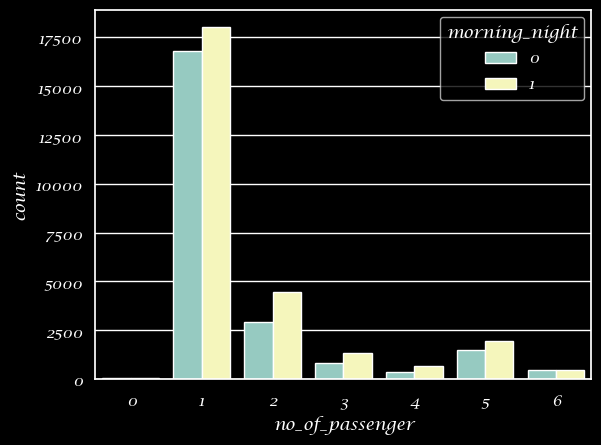

In [41]:
sns.countplot(x="no_of_passenger",hue='morning_night',data=df)
plt.show()

In [42]:
df=df.drop(['unique_id'],axis=1)

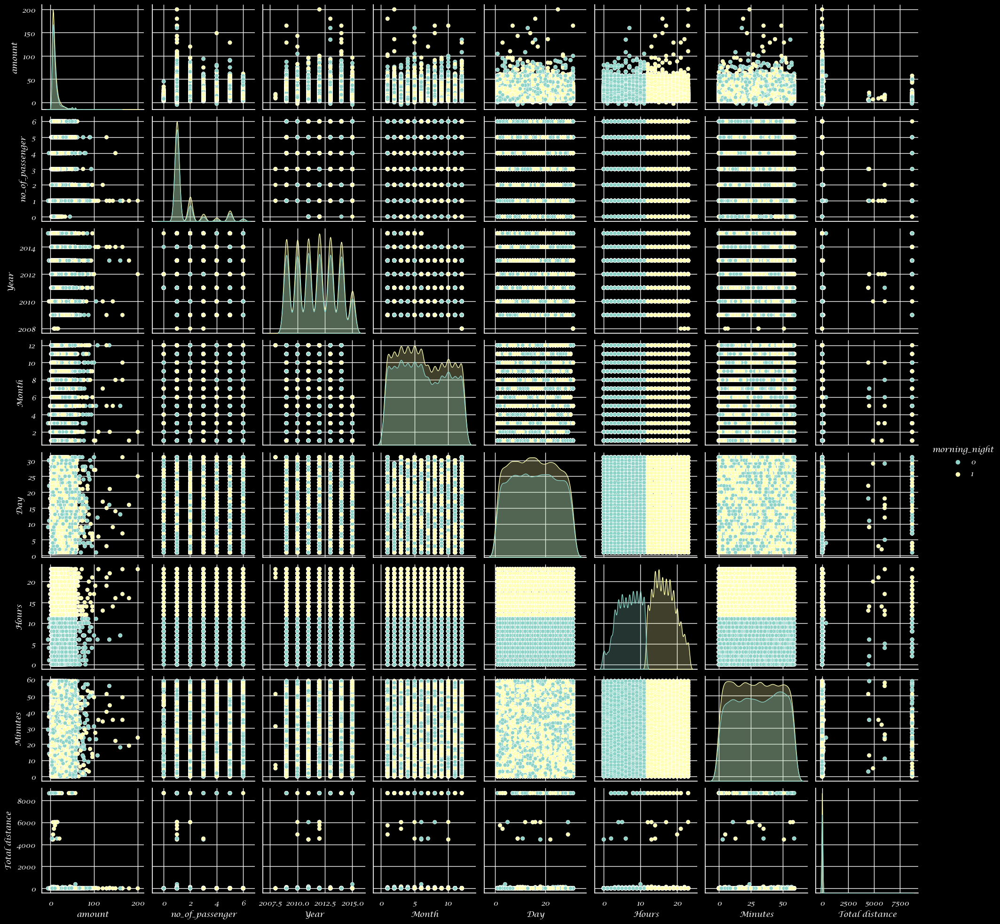

In [43]:
sns.pairplot(df,hue="morning_night")

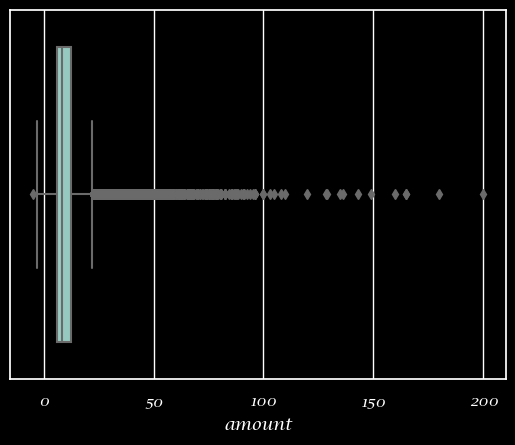

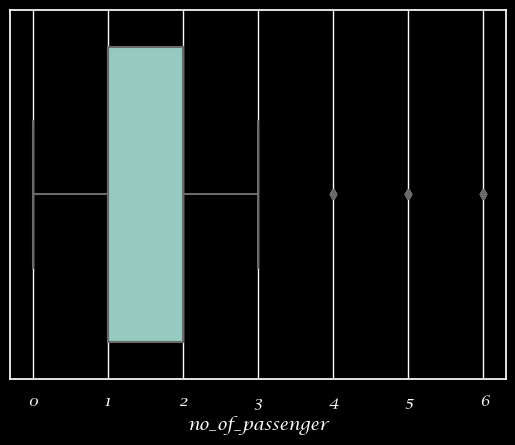

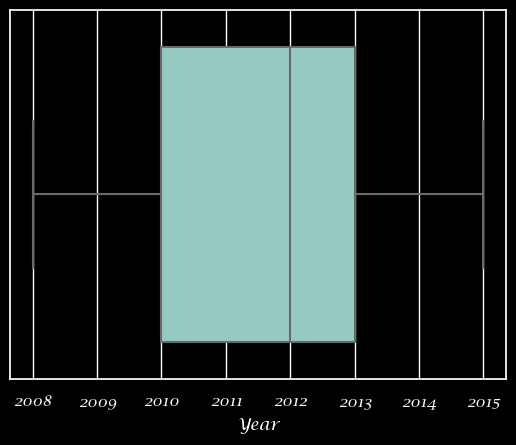

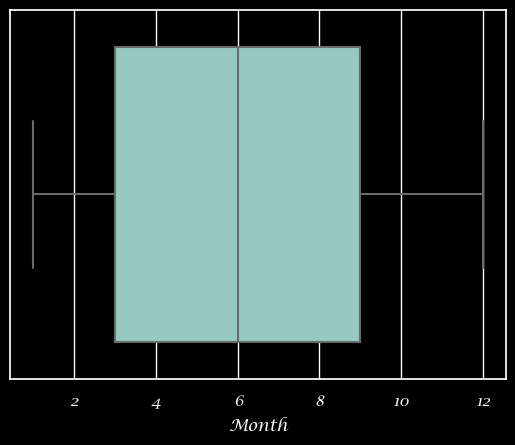

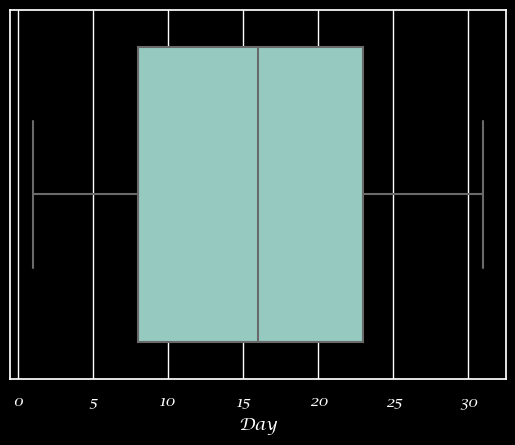

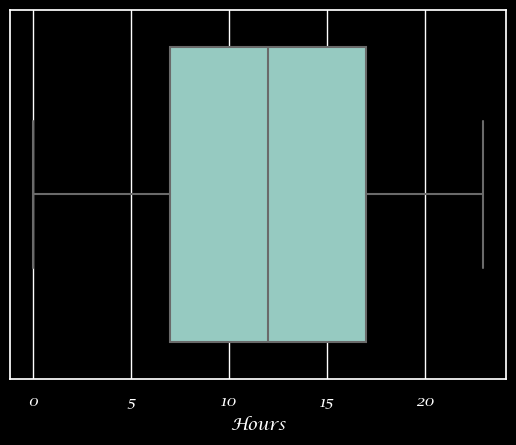

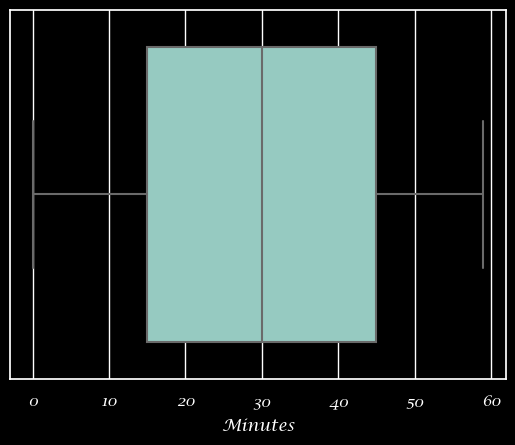

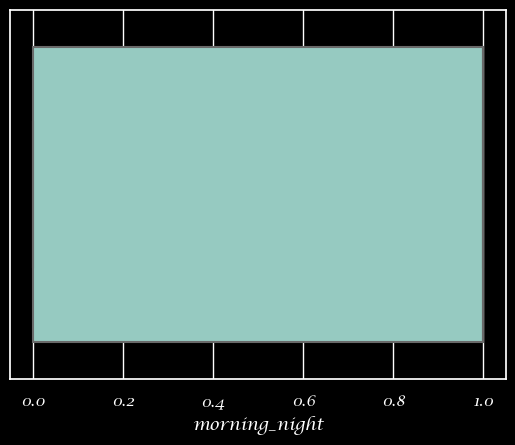

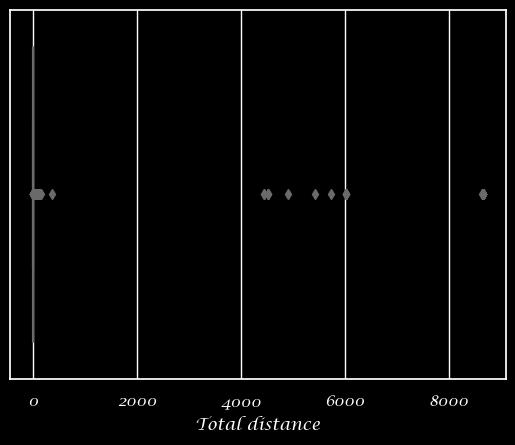

             amount  no_of_passenger          Year         Month  \
count  50000.000000     50000.000000  50000.000000  50000.000000   
mean      11.364171         1.667840   2011.738560      6.277660   
std        9.685557         1.289195      1.862804      3.461942   
min       -5.000000         0.000000   2008.000000      1.000000   
25%        6.000000         1.000000   2010.000000      3.000000   
50%        8.500000         1.000000   2012.000000      6.000000   
75%       12.500000         2.000000   2013.000000      9.000000   
max      200.000000         6.000000   2015.000000     12.000000   

                Day         Hours       Minutes  morning_night  Total distance  
count  50000.000000  50000.000000  50000.000000   50000.000000    50000.000000  
mean      15.689260     12.037400     29.665420       0.539800       18.508946  
std        8.660559      5.848911     17.306535       0.498418      355.564309  
min        1.000000      0.000000      0.000000       0.000000 

In [44]:
for idx,cat_col in enumerate(df):
    sns.boxplot(x=cat_col,data=df)
    plt.show()
    
print(df.describe())

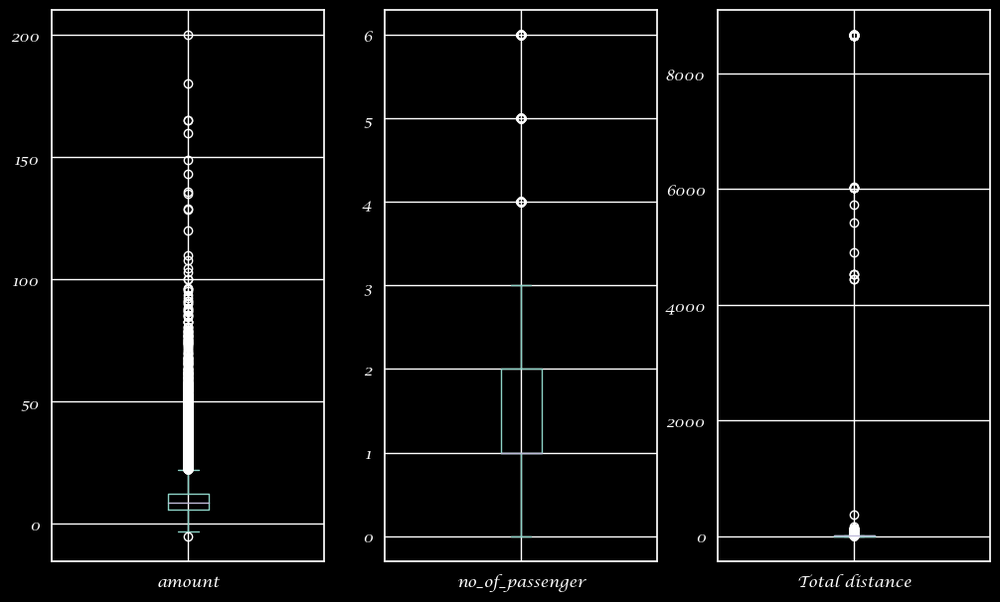

In [45]:
plt.subplot(131)
df['amount'].plot.box(figsize=(10,6))
plt.tight_layout(pad=0.5)
plt.subplot(132)
df['no_of_passenger'].plot.box()
plt.tight_layout(pad=0.5)
plt.subplot(133)
df['Total distance'].plot.box()
plt.tight_layout(pad=0.5)

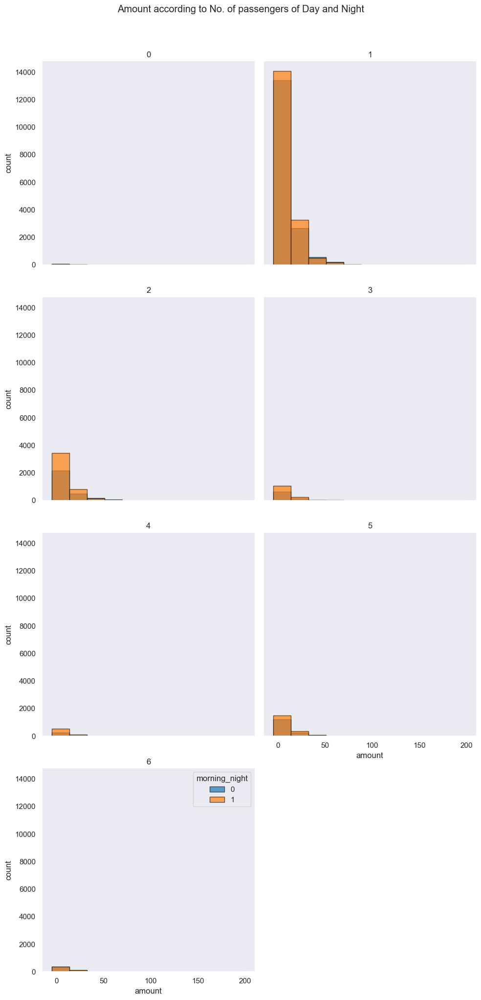

In [46]:
custom_palette=sns.color_palette("tab10",2)
bins=np.linspace(df['amount'].min(),df['amount'].max(),12)
sns.set(style="dark")
graph=sns.FacetGrid(df,col="no_of_passenger",hue="morning_night",palette=custom_palette,col_wrap=2,height=5)
graph.map(plt.hist, 'amount',bins=bins,ec="k",alpha=0.7)
graph.set_titles(col_template="{col_name}")
graph.axes[-1].legend(title='morning_night', loc='upper right')
graph.set_axis_labels("amount","count")
graph.fig.suptitle("Amount according to No. of passengers of Day and Night",y=1.02)
plt.tight_layout()
plt.show()

In [47]:
correlation_mat=df.corr(numeric_only=True)

<Axes: >

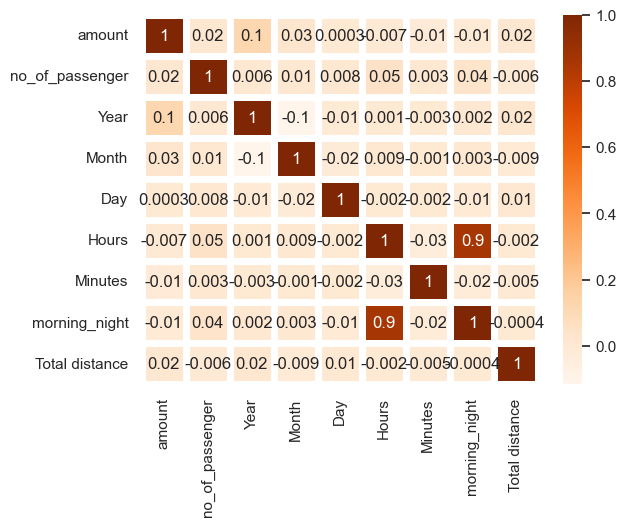

In [48]:
sns.heatmap(correlation_mat,linewidths=5,cmap="Oranges",annot=True,fmt='.1g')

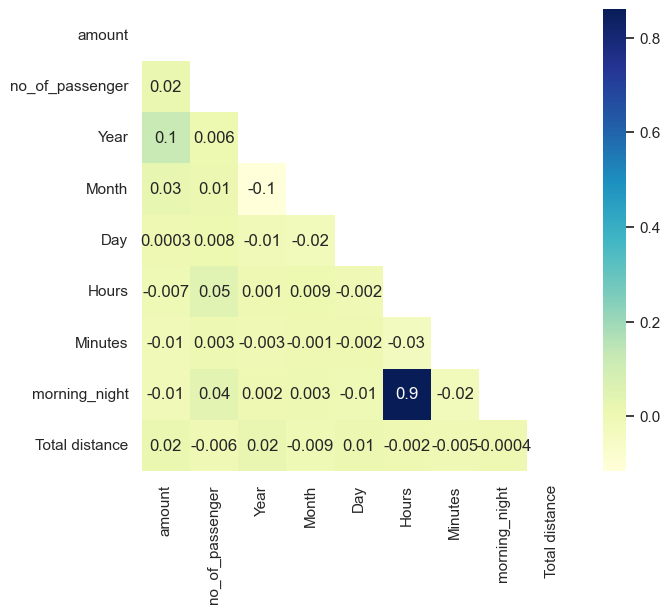

In [49]:
mask=np.zeros_like(correlation_mat)
mask[np.triu_indices_from(mask)]=True
with sns.axes_style("white"):
    f,ax=plt.subplots(figsize=(7,6))
    ax=sns.heatmap(correlation_mat,mask=mask,annot=True,cmap="YlGnBu",fmt='0.1g')

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   amount           50000 non-null  float64
 1   no_of_passenger  50000 non-null  int64  
 2   Year             50000 non-null  int32  
 3   Month            50000 non-null  int32  
 4   Day              50000 non-null  int32  
 5   Hours            50000 non-null  int32  
 6   Minutes          50000 non-null  int32  
 7   morning_night    50000 non-null  int32  
 8   Total distance   50000 non-null  float64
dtypes: float64(2), int32(6), int64(1)
memory usage: 2.3 MB


In [51]:
df.isnull().sum()

amount             0
no_of_passenger    0
Year               0
Month              0
Day                0
Hours              0
Minutes            0
morning_night      0
Total distance     0
dtype: int64

In [52]:
fig=px.histogram(df["amount"],x="amount",y="amount")
fig.update_layout(title="amount")
fig.show()

fig=px.histogram(df["Total distance"],x="Total distance",y="Total distance")
fig.update_layout(title="Total distance")
fig.show()

In [53]:
median=df['amount'].median()

In [54]:
df["amount"]=df["amount"].replace(np.nan,median)

In [55]:
def outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    uppM=Q3+(1.5*IQR)
    lowM=Q1-(1.5*IQR)
    return uppM,lowM

In [56]:
lower,upper=outlier(df['amount'])
df['amount']=np.where(df['amount']<lower,lower,df['amount'])
df['amount']=np.where(df['amount']>upper,upper,df['amount'])

In [57]:
def outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    uppM=Q3+(1.5*IQR)
    lowM=Q1-(1.5*IQR)
    return uppM,lowM

In [58]:
lower,upper=outlier(df['Total distance'])
df['Total distance']=np.where(df['Total distance']<lower,lower,df['Total distance'])
df['Total distance']=np.where(df['Total distance']>upper,upper,df['Total distance'])

<Axes: xlabel='amount'>

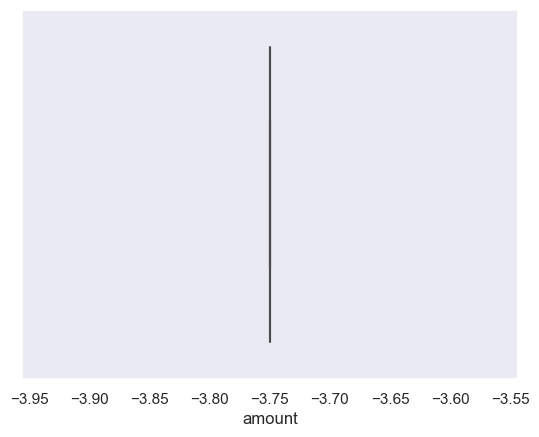

In [59]:
sns.boxplot(x='amount',data=df)

<Axes: xlabel='Total distance'>

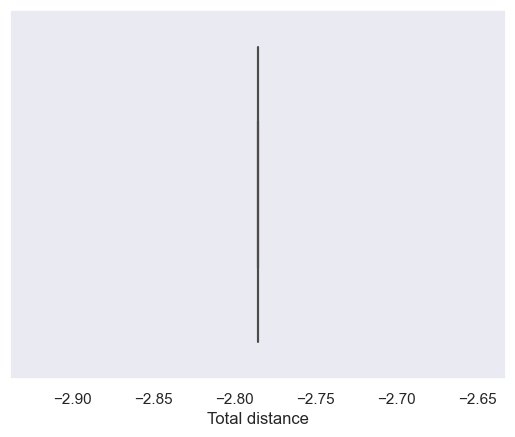

In [60]:
sns.boxplot(x='Total distance',data=df)

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [62]:
#Dividing data into input X variable and target y variable
x=df.drop(["amount"],axis=1)
y=df["amount"]

In [63]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=1)

# Linear Regression---->>

In [64]:
model_log=LinearRegression()

In [65]:
model_log.fit(x_train,y_train)

LinearRegression()

In [66]:
model_log.score(x_train,y_train)

1.0

In [67]:
model_log.score(x_test,y_test)

1.0

# Support Vector Regression----->>

In [68]:
model_svr=SVR()

In [69]:
model_svr.fit(x_train,y_train)

SVR()

In [70]:
model_svr.score(x_train,y_train)

1.0

In [71]:
model_svr.score(x_test,y_test)

1.0

# Decision Tree Regression---->>

In [72]:
model_dtr=DecisionTreeRegressor()

In [73]:
model_dtr.fit(x_train,y_train)

DecisionTreeRegressor()

In [74]:
model_dtr.score(x_train,y_train)

1.0

In [75]:
model_dtr.score(x_test,y_test)

1.0

# Bagging Regression------>>

In [76]:
from sklearn.ensemble import BaggingRegressor

In [77]:
model_br=BaggingRegressor()

In [78]:
model_br.fit(x_train,y_train)

BaggingRegressor()

In [79]:
model_br.score(x_train,y_train)

1.0

In [80]:
model_br.score(x_test,y_test)

1.0

# AdaBoostRegressor------>>

In [81]:
m_abr=AdaBoostRegressor()

In [82]:
m_abr.fit(x_train,y_train)

AdaBoostRegressor()

In [83]:
m_abr.score(x_train,y_train)

1.0

In [84]:
m_abr.score(x_test,y_test)

1.0

# Gradient Boosting Regressor

In [85]:
m_gbr=GradientBoostingRegressor()

In [86]:
m_gbr.fit(x_train,y_train)

GradientBoostingRegressor()

In [87]:
m_gbr.score(x_train,y_train)

1.0

In [88]:
m_gbr.score(x_test,y_test)

1.0

# Random Forest Regressor

In [89]:
m_rfr=RandomForestRegressor()

In [90]:
m_rfr.fit(x_train,y_train)

RandomForestRegressor()

In [91]:
m_rfr.score(x_train,y_train)

1.0

In [92]:
m_rfr.score(x_test,y_test)

1.0